In [1]:
## 데이터 전처리에 사용한 모듈
import pandas as pd
import numpy as np
from pathlib import Path
import sys
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from scipy.signal import savgol_filter

## 시각화에 사용한 모듈
%matplotlib inline
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from plotly.graph_objs import Scatter, Line, Layout, Bar

## 데이터 훈련에 사용한 모듈
from sklearn.ensemble import IsolationForest
import tensorflow as tf
from tensorflow.keras.metrics import RootMeanSquaredError, MeanSquaredLogarithmicError
from tensorflow.keras.losses import MeanSquaredLogarithmicError, MeanSquaredError
from tensorflow.keras.layers import Dense, LSTM, GRU, Bidirectional, RNN, BatchNormalization, TimeDistributed, LeakyReLU
from tensorflow.keras.experimental import PeepholeLSTMCell
from tensorflow.keras.models import Sequential, Model

In [2]:
# 함수 기능 : 여러 개의 같은 형식을 가지고 있는 데이터를 차례대로 불러온 후,
#           불러온 순서대로 각각 다른 변수에 할당해 줌
# 사용한 모듈 : sys
def ReadAndMakeVariable(name):
    mod = sys.modules[__name__]
    try:
        if name == 'validation':
            validset = pd.read_csv('data/HAI 2.0/{}/{}.csv'.format(name, name))
            return validset
        for i in range(1,5):
            setattr(mod, '{}'.format(name[:-3]+str(i)), pd.read_csv('data/HAI 2.0/{}/{}.csv'.format(name, name[:-3]+str(i))))
    except:
        pass

    return

In [3]:
ReadAndMakeVariable('training')  # train1~3 데이터셋 생성
trainset = pd.concat([train1[1:],train2[1:],train3[1:]])  # 행 기준 합치기
del([train1,train2,train3])  # 필요 없는 변수 삭제

ReadAndMakeVariable('testing')  # test1~4 데이터셋 생성
testset = pd.concat([test1[1:],test2[1:],test3[1:],test4[1:]])  # 행 기준 합치기
del([test1,test2,test3,test4])  # 필요 없는 변수 삭제

validset = ReadAndMakeVariable('validation')
validset.drop(0, inplace=True)

In [4]:
# 클래스 구성 : 데이터의 각 컬럼마다 값들의 최솟값과 최댓값이 같은지 조사한 후 참인 컬럼들을 데이터 프레임 형식으로 반환하는 SameMinMaxValue함수,
#             데이터를 최소최대 정규화 혹은 z-score 정규화와 data smoothing 을 해준 후 데이터프레임을 반환하는 CleaningAndNormalize함수,
#             데이터 프레임의 밸류값의 범위와 NAN값을 포함하는 컬럼을 조사한 후 불리언값(NAN값이 존재하면 NAN값이 존재하는 컬럼명 반환)을 반환하는 RangeCheck함수,
#             
#             구성되어 있다.
# 사용한 모듈 : sklearn.preprocessing 의 MinMaxScaler & StandardScaler
#             scipy.signal 의 savgol_filter
#             numpy, numpy 의 convolve
class Processing():
    def SameMinMaxValue(df):
        same = (df.max() == df.min()).to_frame()
        return same[same[0] == 1].index.values
    
    def smooth(y, box_pts):
        box = np.ones(box_pts)/box_pts
        y_smooth = np.convolve(y, box, mode='same')
        return y_smooth

    def CleaningAndNormalize(df, scale, smoothing = False):
        if 'time' in df.columns:
            df = df.drop('time', axis=1)

        if scale == 'minmax':
            scaler = MinMaxScaler()
            df[df.columns] = scaler.fit_transform(df[df.columns])
        elif scale == 'standard':
            scaler = StandardScaler()
            df[df.columns] = scaler.fit_transform(df[df.columns])
        elif scale == 'tanh':
            scaler = MinMaxScaler((-1,1))
            df[df.columns] = scaler.fit_transform(df[df.columns])
        
        if smoothing:
            for col in df.columns:
                df[col] = Processing.smooth(df[col], 5)
            #for col in df.columns:
            #    df[col] = savgol_filter(df[col], 51, 1) # window size 51, 다항식 순서 1

        return df
    
    def RangeCheck(df):
        x = np.array(df, dtype=np.float32)
        if np.any(np.isnan(x)):
            print('Has NAN columns :', [col for col in df.columns if df[col].isna().sum() > 0])
        return np.any(x < 0), np.any(x > 1), np.any(np.isnan(x))
    
    def MakeDataset(df):    # numpy array배열로 데이터셋 재구축
        dataset,labels = [],[]
        array = np.array(df)
        for i in range(len(df)):
            if i == len(df) - 59:
                break
            dataset.append(array[i:59+i])  # window size 는 60, 그 중 각 60번째가 레이블, 나머지 59개는 학습
            labels.append(array[59+i])
        
        dataset = np.array(dataset, dtype=np.float32)
        labels = np.array(labels, dtype=np.float32).reshape(np.shape(labels)[0], 1, np.shape(labels)[1])
        return dataset, labels

In [5]:
%%time
Processing.SameMinMaxValue(trainset)

CPU times: user 16.2 s, sys: 3.82 s, total: 20 s
Wall time: 20.3 s


array(['C02', 'C03', 'C14', 'C18', 'C19', 'C21', 'C22', 'C25', 'C33',
       'C34', 'C35', 'C37', 'C40', 'C43', 'C51', 'C52', 'C59', 'C61',
       'C63', 'C64', 'C65', 'C67'], dtype=object)

In [6]:
%%time
scaled_trainset = Processing.CleaningAndNormalize(trainset, 'minmax', True)
scaled_trainset.head(), scaled_trainset.shape

CPU times: user 10.9 s, sys: 2.98 s, total: 13.9 s
Wall time: 14.2 s


(        C01  C02  C03       C04       C05       C06       C07       C08  \
 1  0.227174  0.0  0.0  0.136034  0.179275  0.000092  0.237340  0.226033   
 2  0.303261  0.0  0.0  0.181396  0.210812  0.000123  0.320323  0.364227   
 3  0.379150  0.0  0.0  0.226757  0.234847  0.000154  0.399665  0.441381   
 4  0.379546  0.0  0.0  0.226810  0.189072  0.000154  0.407189  0.431228   
 5  0.380040  0.0  0.0  0.226810  0.164005  0.000154  0.406284  0.431287   
 
         C09       C10  ...       C70  C71       C72       C73       C74  \
 1  0.482986  0.306626  ...  0.356977  0.0  0.195902  0.153456  0.201351   
 2  0.647801  0.370535  ...  0.476788  0.0  0.261269  0.204695  0.268918   
 3  0.814468  0.412217  ...  0.596850  0.0  0.326636  0.256162  0.335134   
 4  0.823727  0.329888  ...  0.598612  0.0  0.325438  0.256937  0.333781   
 5  0.832639  0.247794  ...  0.598298  0.0  0.324438  0.257651  0.332429   
 
         C75       C76       C77  C78       C79  
 1  0.549996  0.159182  0.151663  

In [7]:
%%time
Processing.RangeCheck(scaled_trainset)

CPU times: user 621 ms, sys: 421 ms, total: 1.04 s
Wall time: 1.04 s


(False, False, False)

In [8]:
## matplotlib.pyplot 을 사용해서 시각화
# 목적 : 주어진 데이터에 적합한 노이즈 스무딩 방법 찾기
def visualization(x, col, t):

    y = pd.DataFrame(smooth(x[col],5), columns=[col])  # np.convolve 를 사용하여 데이터 스무딩
    y2 = pd.DataFrame(savgol_filter(x[col], 51, 1), columns=[col]) # savgol_filter 사용(window size 51, polynomial order 3)

    font = {'family':'AppleGothic',
            'color':'steelblue',
            'size':20}

    for i in range(len(x)//3600*t):  # 관찰 시간을 3시간으로 나누어서 시각화
        plt.figure(figsize=(20,12))
        plt.title("{} operating each 3 hours".format(col), fontdict=font)
        plt.ylim(-0.01,1.01)

        plt.plot(x[col].iloc[3600*t*i:3600*t*(i+1)], color='steelblue', alpha=0.4, label='{}'.format(col))
        plt.plot(y[col].iloc[3600*t*i:3600*t*(i+1)], color='blue', alpha=0.5, label='{}'.format(col))
        plt.plot(y2[col].iloc[3600*t*i:3600*t*(i+1)], color='red', alpha=0.7, label='{}'.format(col))
        #plt.plot(x['attack'].iloc[10800*i:10800*(i+1)], color='green', alpha=0.8, label='{}'.format(col))

        plt.legend()
        plt.ylabel("condition", fontdict=font)
        plt.xlabel("time (sec)", fontdict=font)
        plt.show()

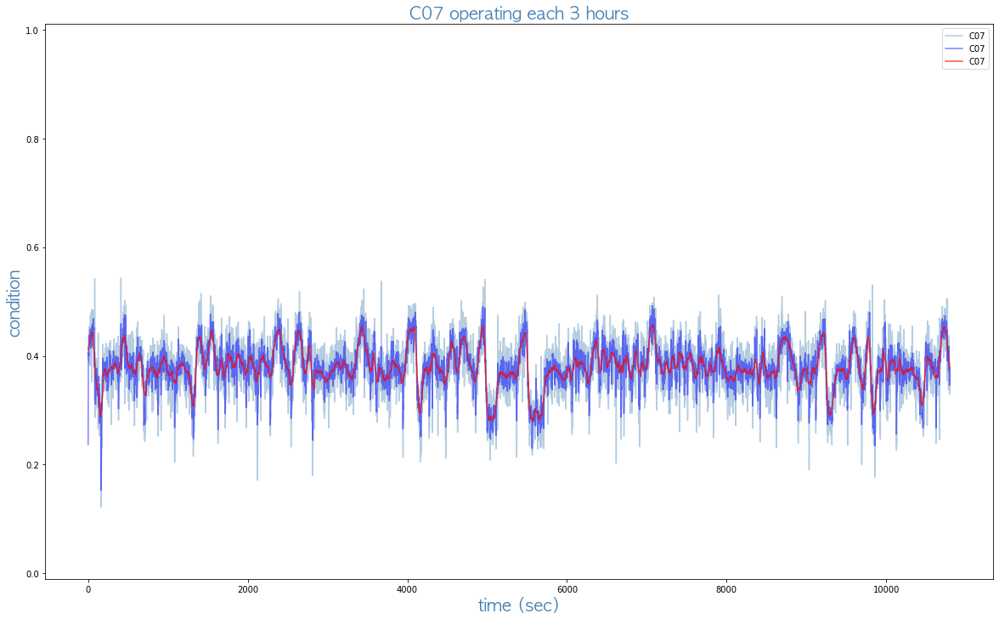

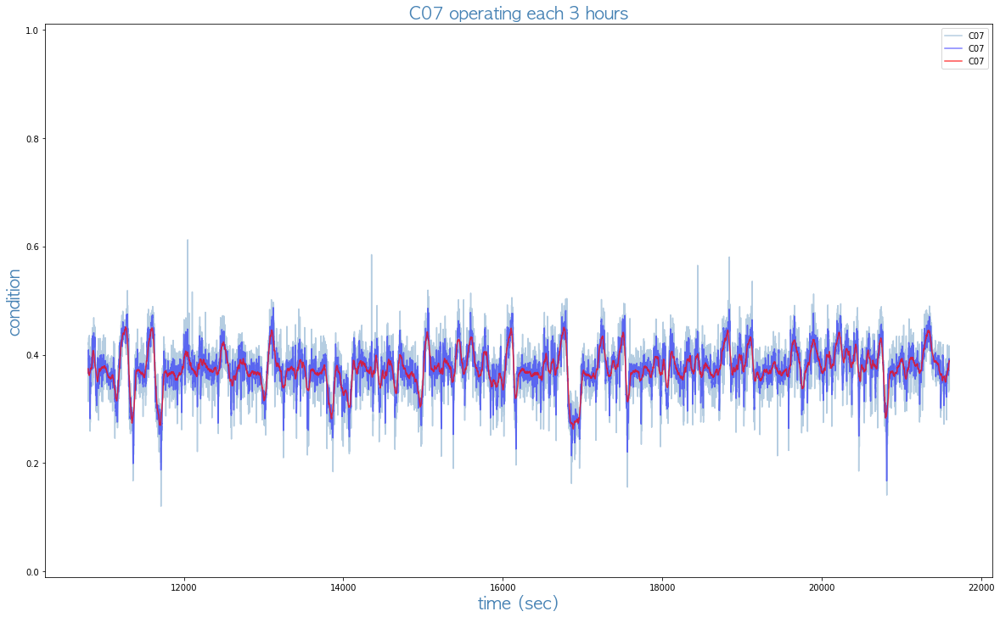

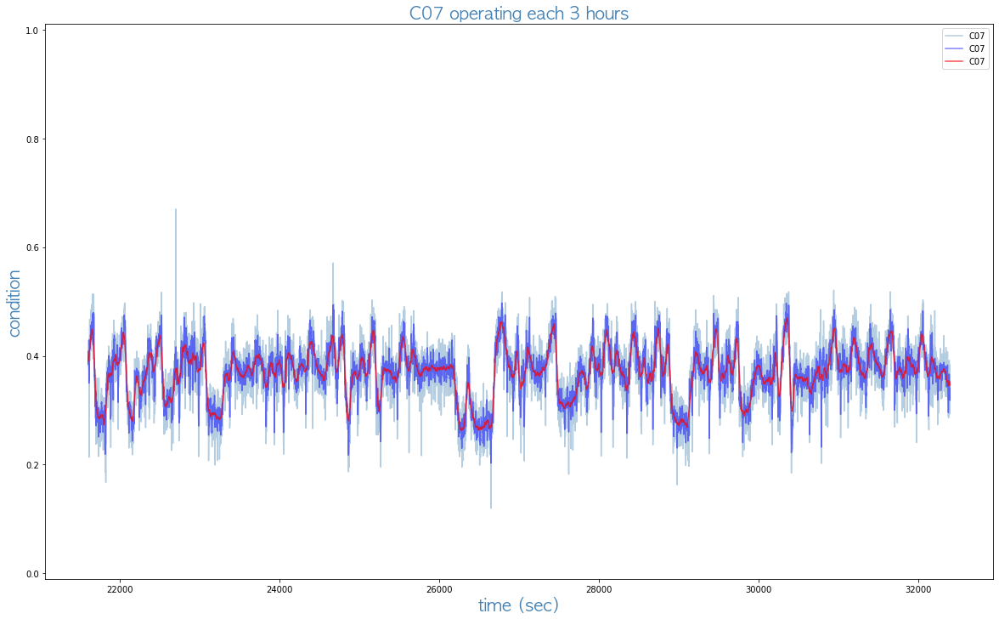

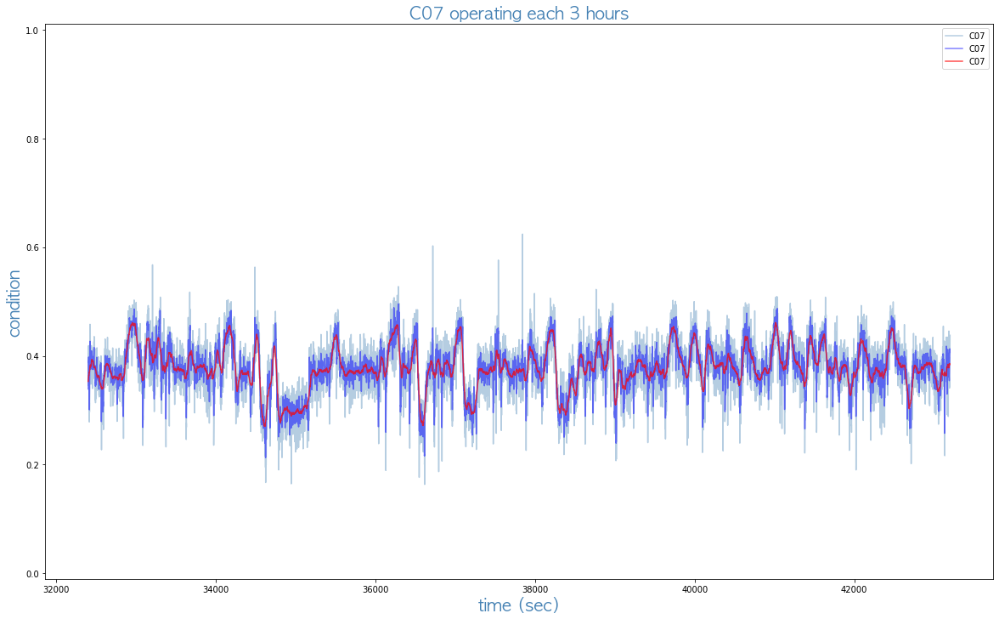

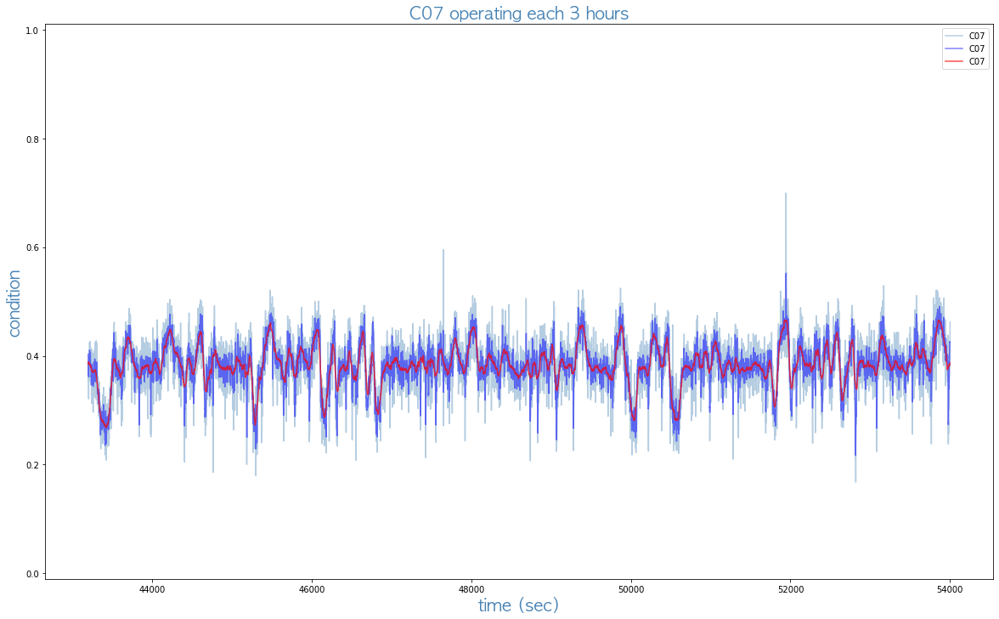

...

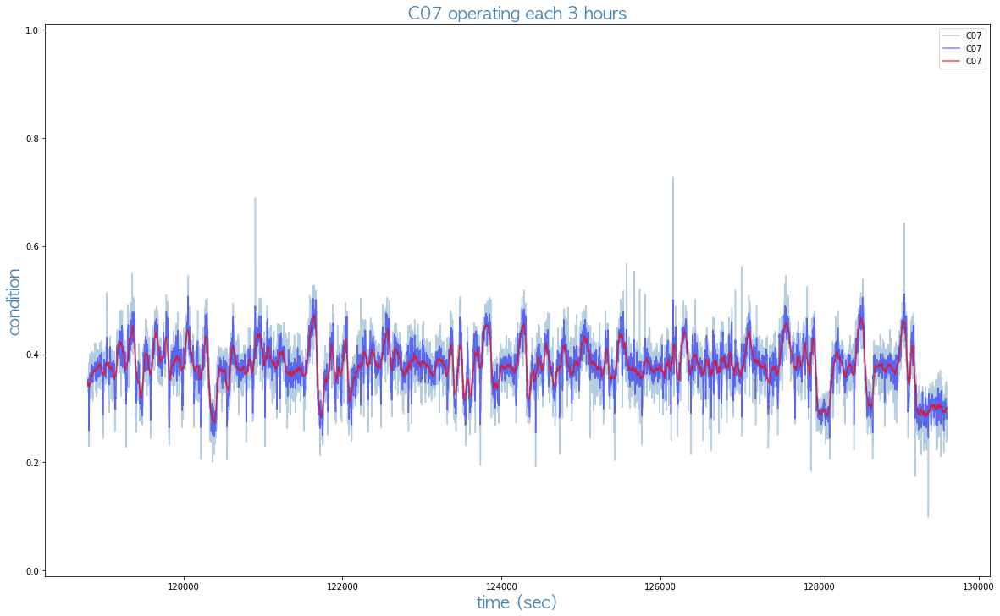

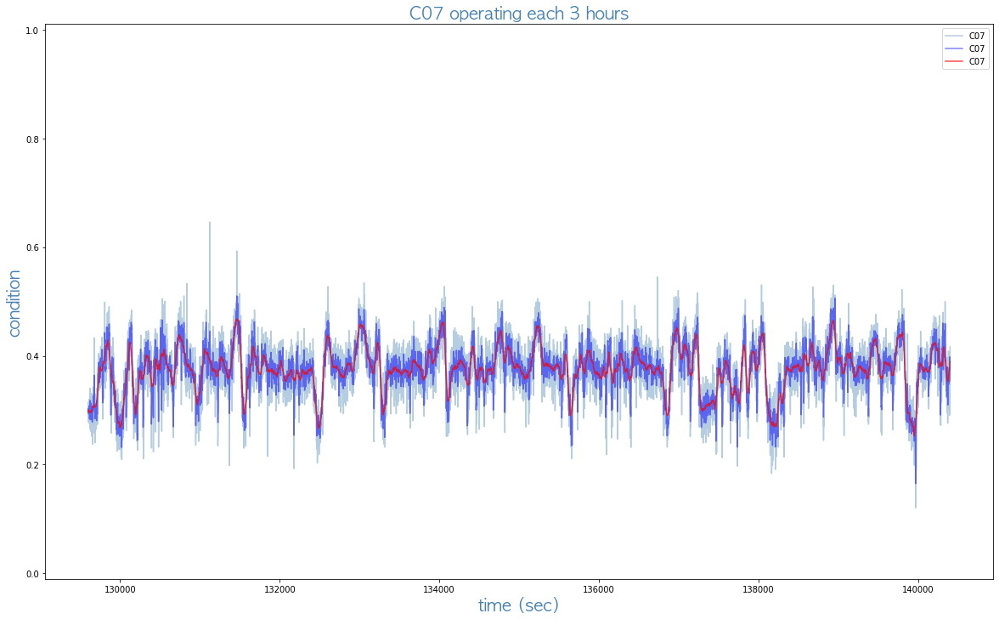

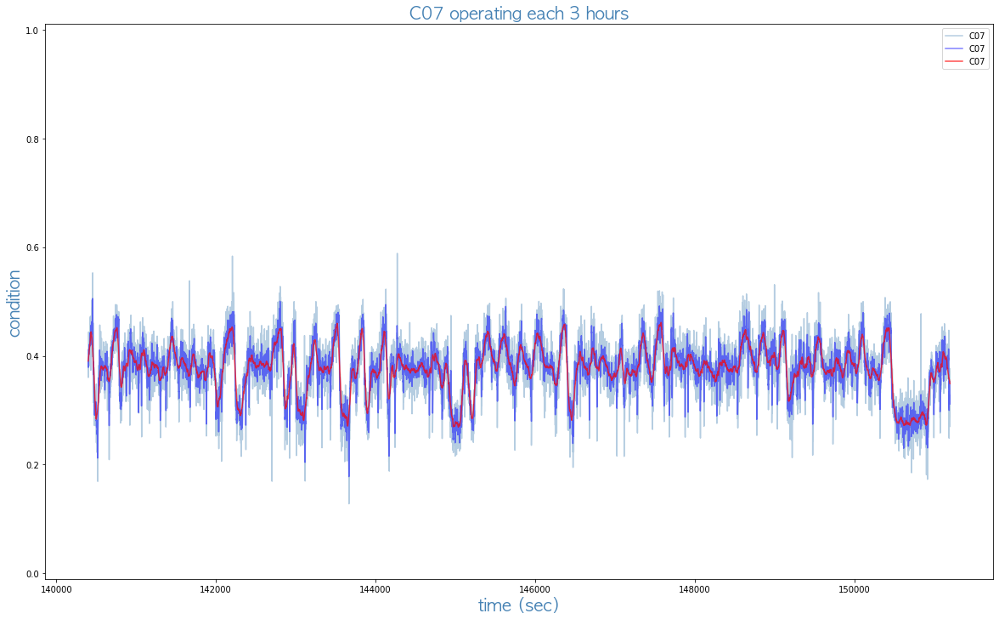

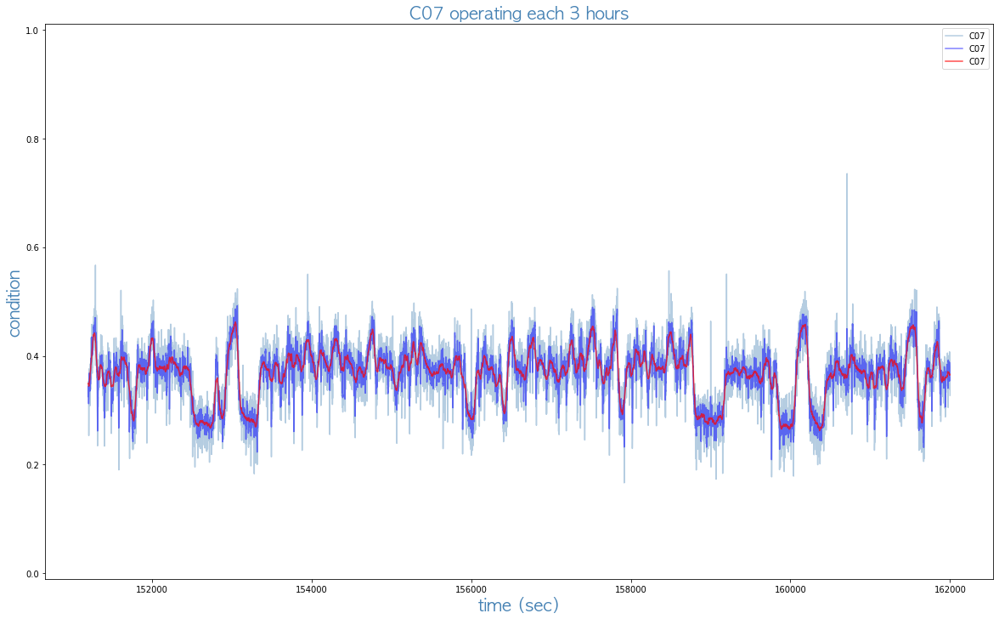

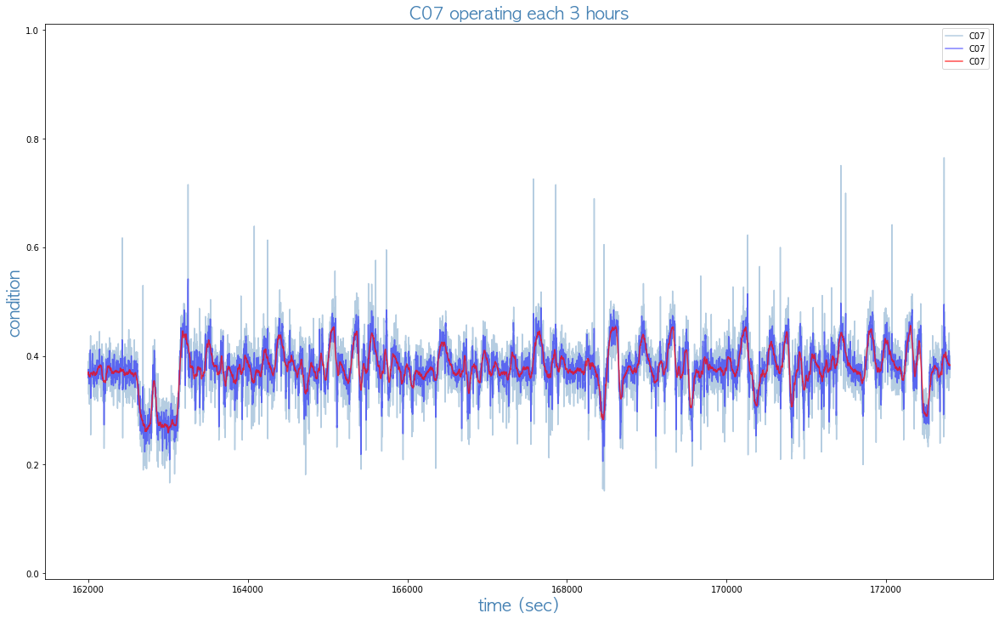

KeyboardInterrupt: 

In [334]:
visualization(scaled_trainset, 'C07', 3)

In [8]:
X_train, y_train = Processing.MakeDataset(scaled_trainset)

In [9]:
X_train[-1]

array([[0.30187762, 0.        , 0.        , ..., 0.4601501 , 0.26161984,
        0.74362636],
       [0.30148235, 0.        , 0.        , ..., 0.47048795, 0.26161984,
        0.75751156],
       [0.30108708, 0.        , 0.        , ..., 0.47098407, 0.26161984,
        0.77248806],
       ...,
       [0.30415037, 0.        , 0.        , ..., 0.25073737, 0.26161984,
        0.7110959 ],
       [0.30464438, 0.        , 0.        , ..., 0.2582729 , 0.26161984,
        0.6978282 ],
       [0.24417   , 0.        , 0.        , ..., 0.20883605, 0.20929587,
        0.54794127]], dtype=float32)

In [10]:
y_train[-1]

array([[1.8320163e-01, 0.0000000e+00, 0.0000000e+00, 4.2221045e-01,
        1.7972389e-01, 3.2271934e-04, 2.7171537e-01, 2.6257378e-01,
        3.3101853e-02, 2.5963843e-01, 2.9681876e-01, 2.7332711e-01,
        2.1725410e-01, 0.0000000e+00, 5.1627332e-01, 1.2944479e-01,
        5.4844609e-04, 0.0000000e+00, 0.0000000e+00, 1.8639351e-01,
        0.0000000e+00, 0.0000000e+00, 4.4257081e-01, 4.6248043e-01,
        0.0000000e+00, 5.0418860e-01, 3.1277338e-01, 0.0000000e+00,
        2.1248858e-01, 3.9664265e-02, 5.8629817e-01, 1.6298077e-01,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 6.0000002e-01,
        0.0000000e+00, 5.6773639e-01, 1.8748464e-01, 0.0000000e+00,
        6.0000002e-01, 6.1617460e-04, 0.0000000e+00, 2.9436454e-01,
        2.9274002e-01, 5.0310445e-01, 3.3484849e-01, 0.0000000e+00,
        2.7341771e-01, 4.0359282e-01, 0.0000000e+00, 0.0000000e+00,
        3.8348603e-01, 6.0000002e-01, 4.4071016e-01, 5.9270644e-01,
        2.8880946e-02, 3.6803907e-01, 0.0000000e

In [11]:
len(X_train), len(y_train)

(921541, 921541)

In [12]:
np.shape(X_train)

(921541, 59, 79)

In [13]:
np.shape(y_train)

(921541, 1, 79)

In [14]:
scaled_trainset

,C01,C02,C03,C04,C05,C06,C07,C08,C09,C10,...,C70,C71,C72,C73,C74,C75,C76,C77,C78,C79
1,0.227174,0.0,0.0,0.136034,0.179275,0.000092,0.237340,0.226033,0.482986,0.306626,...,0.356977,0.0,0.195902,0.153456,0.201351,0.549996,0.159182,0.151663,0.600000,0.283053
2,0.303261,0.0,0.0,0.181396,0.210812,0.000123,0.320323,0.364227,0.647801,0.370535,...,0.476788,0.0,0.261269,0.204695,0.268918,0.733328,0.211697,0.201086,0.800000,0.379244
3,0.379150,0.0,0.0,0.226757,0.234847,0.000154,0.399665,0.441381,0.814468,0.412217,...,0.596850,0.0,0.326636,0.256162,0.335134,0.916661,0.263327,0.250737,1.000000,0.487619
4,0.379546,0.0,0.0,0.226810,0.189072,0.000154,0.407189,0.431228,0.823727,0.329888,...,0.598612,0.0,0.325438,0.256937,0.333781,0.916661,0.261254,0.249852,1.000000,0.509947
5,0.380040,0.0,0.0,0.226810,0.164005,0.000154,0.406284,0.431287,0.832639,0.247794,...,0.598298,0.0,0.324438,0.257651,0.332429,0.916661,0.259236,0.247640,1.000000,0.557533
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
478796,0.303261,0.0,0.0,0.703684,0.463082,0.000538,0.463654,0.457556,0.064468,0.581541,...,0.679737,0.0,0.300850,0.497743,0.200001,0.111119,0.317137,0.250228,0.261620,0.751804
478797,0.304150,0.0,0.0,0.703684,0.430331,0.000538,0.467936,0.432054,0.061227,0.581526,...,0.680618,0.0,0.300950,0.496899,0.200001,0.111119,0.312215,0.250737,0.261620,0.711096
478798,0.304644,0.0,0.0,0.703684,0.378318,0.000538,0.452481,0.396340,0.058218,0.527718,...,0.682758,0.0,0.301049,0.496533,0.200001,0.111119,0.310184,0.258273,0.261620,0.697828
478799,0.244170,0.0,0.0,0.562947,0.276256,0.000430,0.369377,0.329339,0.045370,0.397762,...,0.546018,0.0,0.240879,0.396925,0.159460,0.088895,0.247362,0.208836,0.209296,0.547941


In [15]:
?Bidirectional

Init signature: Bidirectional(*args, **kwargs)
Docstring:     
Bidirectional wrapper for RNNs.

Arguments:
  layer: `keras.layers.RNN` instance, such as `keras.layers.LSTM` or
    `keras.layers.GRU`. It could also be a `keras.layers.Layer` instance
    that meets the following criteria:
    1. Be a sequence-processing layer (accepts 3D+ inputs).
    2. Have a `go_backwards`, `return_sequences` and `return_state`
      attribute (with the same semantics as for the `RNN` class).
    3. Have an `input_spec` attribute.
    4. Implement serialization via `get_config()` and `from_config()`.
    Note that the recommended way to create new RNN layers is to write a
    custom RNN cell and use it with `keras.layers.RNN`, instead of
    subclassing `keras.layers.Layer` directly.
  merge_mode: Mode by which outputs of the forward and backward RNNs will be
    combined. One of {'sum', 'mul', 'concat', 'ave', None}. If None, the
    outputs will not be combined, they will be returned as a list. Defa

In [23]:
def build_model(INPUT_SHAPE, INPUT_DIM):
    model = Sequential()
    model.add(Bidirectional(GRU(200, activation='relu', recurrent_activation='relu', return_sequences=True, input_shape=INPUT_SHAPE)))
    model.add(Dense(INPUT_DIM, activation='sigmoid'))

    return model
model = build_model(X_train.shape, X_train.shape[2])

In [25]:
# 로그 초기화
!rm -rf ./logs/GRU/

# 척도
#metrics = tf.keras.metrics.RootMeanSquaredError()
#metrics = tf.keras.metrics.MeanSquaredLogarithmicError()
#metrics = tf.keras.metrics.MeanSquaredError()

# 손실함수
#loss = tf.keras.losses.MeanSquaredLogarithmicError()
loss = tf.keras.losses.MeanSquaredError()
#loss = tf.keras.losses.BinaryCrossentropy()

# 최적화기
#optimizer = tf.keras.optimizers.Adadelta(lr=0.1)  # 종종걸음 너무 작아져서 정지하는걸 막아보자.
#optimizer = tf.keras.optimizers.SGD(lr=0.1)  # 전부 다봐야 하는데 한걸음은 너무 오래 걸리니까 조금만 보고 빨리 판단한다. 같은시간에 더 많이 간다.
#optimizer = tf.keras.optimizers.RMSprop(lr=0.001)  # 보폭을 줄이는건 좋은데 이전 맥락 상황봐가며 하자.
#optimizer = tf.keras.optimizers.Adam(lr=0.001)  # RMSProp + Momentum 방향도 스텝사이즈도 적절하게!(Momentum:스텝 계산해서 움직인 후, 아까 내려오던 관성방향 또 가자)
optimizer = tf.keras.optimizers.Adagrad(lr=0.001)  # 안가본곳은 성큼 빠르게 훑고, 많이 가본곳은 잘아니까 갈수록 보폭을 줄여 세밀히 탐색
#optimizer = tf.keras.optimizers.Adamax(lr=0.001)
#optimizer = tf.keras.optimizers.Nadam(lr=0.01)  # Adam에 Momentum 대신에 NAG를 붙이자(NAG:일단 관성방향 먼저 움직이고, 움직인 자리에 스텝을 계산하니 더 빠르더라)
#optimizer = tf.keras.optimizers.Ftrl(lr=0.01)

## 컴파일
model.compile(loss=loss, optimizer=optimizer)

In [26]:
# 훈련
data_dir = './model/GRU/'
logs_dir = './logs/GRU'
best_model_file = os.path.join(data_dir, 'best_model.h5')
checkpoint = tf.keras.callbacks.ModelCheckpoint(best_model_file, monitor='loss', save_weights_only=True, save_best_only=True)
tensorboard = tf.keras.callbacks.TensorBoard(log_dir=logs_dir)
#early_stopping = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=5, mode='min', restore_best_weights=True)
callbacks = [checkpoint, tensorboard]
N_EPOCHS = 32
BATCH_SIZE = 512
history = model.fit(X_train, y_train,
                    epochs=N_EPOCHS,
                    callbacks=callbacks,
                    batch_size=BATCH_SIZE)

Epoch 1/32
1800/1800 [==============================] - 1250s 695ms/step - loss: 0.1270
Epoch 2/32
1800/1800 [==============================] - 1261s 700ms/step - loss: 0.1034
Epoch 3/32
1800/1800 [==============================] - 1262s 701ms/step - loss: 0.0832
Epoch 4/32
1800/1800 [==============================] - 1266s 704ms/step - loss: 0.0683
Epoch 5/32
1800/1800 [==============================] - 1256s 698ms/step - loss: 0.0589
Epoch 6/32
1800/1800 [==============================] - 1239s 688ms/step - loss: 0.0534
Epoch 7/32
1800/1800 [==============================] - 1255s 697ms/step - loss: 0.0499
Epoch 8/32
1800/1800 [==============================] - 1248s 693ms/step - loss: 0.0477
Epoch 9/32
1800/1800 [==============================] - 1241s 689ms/step - loss: 0.0460
Epoch 10/32
1800/1800 [==============================] - 1209s 671ms/step - loss: nan
Epoch 11/32
  60/1800 [>.............................] - ETA: 19:30 - loss: nan

KeyboardInterrupt: 

In [30]:
best_model = build_model(X_train.shape, X_train.shape[2])
best_model.build(input_shape=X_train.shape)
best_model.load_weights('model/GRU/best_model.h5')
best_model.compile(loss=loss, optimizer=optimizer)

In [35]:
best_model

In [383]:
from sklearn.ensemble import IsolationForest
clf=IsolationForest(n_estimators=300, max_samples=60, contamination=float(0.0147), 
                        max_features=1.0, bootstrap=False, n_jobs=-1, random_state=None, verbose=0,behaviour="new")
clf.fit(scaled_trainset)
pred = clf.predict(scaled_validset)
scaled_validset['anomaly'] = pred

print(scaled_validset['anomaly'].value_counts())

KeyboardInterrupt: 

In [381]:
scaled_validset = pd.concat([scaled_validset, attack], axis=1)

In [382]:
from TaPR_pkg import etapr
TaPR = etapr.evaluate(anomalies=attack, predictions=scaled_validset.anomaly)
print(f"F1: {TaPR['f1']:.3f} (TaP: {TaPR['TaP']:.3f}, TaR: {TaPR['TaR']:.3f})")
print(f"# of detected anomalies: {len(TaPR['Detected_Anomalies'])}")
print(f"Detected anomalies: {TaPR['Detected_Anomalies']}")

F1: 0.024 (TaP: 0.013, TaR: 0.500)
# of detected anomalies: 0
Detected anomalies: []


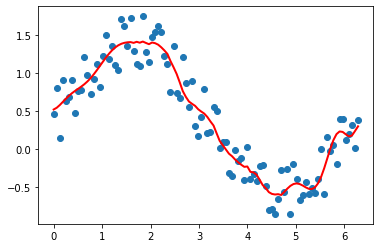

In [323]:
x = np.linspace(0,2*np.pi,100)
y = np.sin(x) + np.random.random(100) * 0.8

y2 = savgol_filter(y, 51, 11) # window size 51, polynomial order 3

plt.plot(x, y,'o')
plt.plot(x, y2, 'r-', lw=2)

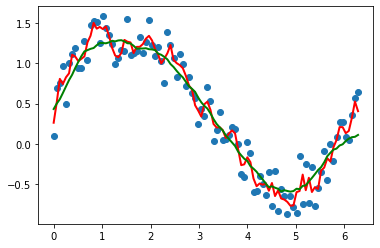

In [322]:
x = np.linspace(0,2*np.pi,100)
y = np.sin(x) + np.random.random(100) * 0.8

def smooth(y, box_pts):
    box = np.ones(box_pts)/box_pts
    y_smooth = np.convolve(y, box, mode='same')
    return y_smooth

plt.plot(x, y,'o')
plt.plot(x, smooth(y,3), 'r-', lw=2)
plt.plot(x, smooth(y,19), 'g-', lw=2)

In [63]:
'''## matplotlib.pyplot 을 사용해서 시각화
def visualization(x, col):

    font = {'family':'AppleGothic',
            'color':'steelblue',
            'size':20}

    #for i in range(len(x)//10800):  # 관찰 시간을 3시간으로 나누어서 시각화
    plt.figure(figsize=(20,12))
    plt.title("{} operating each 3 hours".format(col), fontdict=font)
    plt.ylim(-0.01,1.01)
    #if i == 3:
    plt.plot(x[col], color='steelblue', alpha=0.4, label='{}'.format(col))
    plt.plot(x['attack'], color='steelblue', alpha=0.4, marker='o', markersize='7',
            markeredgewidth = 1, markerfacecolor='None', markeredgecolor='red', label='attack')
    plt.plot(x['detect'], color='steelblue', alpha=0.4, marker='o', markersize='7',
            markeredgewidth = 1, markerfacecolor='None', markeredgecolor='blue', label='detect')
    plt.legend()
    plt.ylabel("condition", fontdict=font)
    plt.xlabel("time (sec)", fontdict=font)
    plt.show()'''

'## matplotlib.pyplot 을 사용해서 시각화\ndef visualization(x, col):\n\n    font = {\'family\':\'AppleGothic\',\n            \'color\':\'steelblue\',\n            \'size\':20}\n\n    #for i in range(len(x)//10800):  # 관찰 시간을 3시간으로 나누어서 시각화\n    plt.figure(figsize=(20,12))\n    plt.title("{} operating each 3 hours".format(col), fontdict=font)\n    plt.ylim(-0.01,1.01)\n    #if i == 3:\n    plt.plot(x[col], color=\'steelblue\', alpha=0.4, label=\'{}\'.format(col))\n    plt.plot(x[\'attack\'], color=\'steelblue\', alpha=0.4, marker=\'o\', markersize=\'7\',\n            markeredgewidth = 1, markerfacecolor=\'None\', markeredgecolor=\'red\', label=\'attack\')\n    plt.plot(x[\'detect\'], color=\'steelblue\', alpha=0.4, marker=\'o\', markersize=\'7\',\n            markeredgewidth = 1, markerfacecolor=\'None\', markeredgecolor=\'blue\', label=\'detect\')\n    plt.legend()\n    plt.ylabel("condition", fontdict=font)\n    plt.xlabel("time (sec)", fontdict=font)\n    plt.show()'

In [79]:
## 메모리 과부하 걸림 tlqkf
'''## plotly.express 사용, 10시간 단위로 프로세스 관찰
def visualization(x,col,P_value):
    # 프로세스 값들을 0 ~ 1 사이로 스케일링 작업
    scaler = MinMaxScaler()
    x[x.columns[1:-4]] = scaler.fit_transform(x[x.columns[1:-4]])

    #for col in x.filter(like=P_value[-2:] + "_").columns:
    for i in range(len(x)//36000):  # 관찰 시간을 10시간으로 나누어서 시각화
        extract = x[['time', col, P_value]].iloc[36000*i:36000*(i+1)]
        melted = extract.melt(id_vars=['time'], value_vars=[col,P_value], var_name='process', value_name='condition')
        fig = px.line(melted, x="time", y="condition", color="process")
        #fig.update_layout(height=450, width=280*40, title_text="{} operating 81 hours".format(col))
        fig.update_layout(hovermode='x unified', updatemenus=[dict(type = "buttons", direction = "left", buttons=list([dict(args=[{"yaxis.type": "linear"}], label="LINEAR", method="relayout"), dict(args=[{"yaxis.type": "log"}], label="LOG", method="relayout")]))], height=600, width=1200, title_text="{} operating {}/{} hours".format(col,10*(i+1),len(x)//3600))
        fig.show()
        sleep(10)
    return'''

'## plotly.express 사용, 10시간 단위로 프로세스 관찰\ndef visualization(x,col,P_value):\n    # 프로세스 값들을 0 ~ 1 사이로 스케일링 작업\n    scaler = MinMaxScaler()\n    x[x.columns[1:-4]] = scaler.fit_transform(x[x.columns[1:-4]])\n\n    #for col in x.filter(like=P_value[-2:] + "_").columns:\n    for i in range(len(x)//36000):  # 관찰 시간을 10시간으로 나누어서 시각화\n        extract = x[[\'time\', col, P_value]].iloc[36000*i:36000*(i+1)]\n        melted = extract.melt(id_vars=[\'time\'], value_vars=[col,P_value], var_name=\'process\', value_name=\'condition\')\n        fig = px.line(melted, x="time", y="condition", color="process")\n        #fig.update_layout(height=450, width=280*40, title_text="{} operating 81 hours".format(col))\n        fig.update_layout(hovermode=\'x unified\', updatemenus=[dict(type = "buttons", direction = "left", buttons=list([dict(args=[{"yaxis.type": "linear"}], label="LINEAR", method="relayout"), dict(args=[{"yaxis.type": "log"}], label="LOG", method="relayout")]))], height=600, width=1200, title_

In [77]:
'''from pyculiarity import detect_ts
from pyculiarity.date_utils import date_format
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

def plot_ts(inDF, y,  savepath ):
    fig = plt.figure(figsize = (22,12))

    plt.plot(inDF.index, inDF[y], alpha = 0.4, label = y)
    plt.legend(); plt.xlabel('time'); plt.ylabel(y)
#     plt.savefig(savepath, dpi = 300); plt.close()

def plot_ts_anoms(inDF, savepath):
    fig = plt.figure(figsize = (22,12))
    #plt.ylim(-0.01,1.01)
    plt.plot(inDF.index, inDF['value'], alpha=0.4, label ='value')
    plt.plot(inDF.index, inDF['anoms'],  color='steelblue', alpha=0.4, marker='o', markersize='7',
                markeredgewidth = 1, markerfacecolor='None', markeredgecolor='red',label='anomalies')
    if 'expected_value' in inDF.columns:
        plt.plot(inDF.index, inDF['expected_value'], color = 'c', marker = '^', markersize = '7',
                 markeredgewidth = 1, markerfacecolor='None', markeredgecolor='c',label='expected_value')

    plt.legend(); plt.xlabel('time');plt.ylabel('value')
#     plt.savefig(savepath, dpi = 300); plt.close()

""" Plotting """
# reformat the index and columns
timeS_DF = validset[['C01','attack']]

anomsDF = timeS_DF[timeS_DF.attack == 1]['C01'].to_frame()
anomsDF.columns = ["anoms"]
anomsDF['is_anom'] = True
# anomsDF.columns = ['anom_value','is_anom']

timeS_DF.drop('attack', axis=1, inplace=True)
timeS_DF.columns = ["value"]

merged_DF = pd.merge(left = timeS_DF, right= anomsDF, left_index=True, right_index=True, how = 'left')
# merged_DF.drop('anom_value',axis = 1,inplace=True)

""" Deliverables """
print('>>> the number of anomaly: ', len(anomsDF))

# plot_ts(timeS_DF, 'value', './figures/orig_%s.png' % n_file ) # original data
plot_ts_anoms(merged_DF,'./void') # anoms marked'''

'from pyculiarity import detect_ts\nfrom pyculiarity.date_utils import date_format\nimport pandas as pd\nimport matplotlib.pyplot as plt\nimport seaborn as sns\n\n%matplotlib inline\n\ndef plot_ts(inDF, y,  savepath ):\n    fig = plt.figure(figsize = (22,12))\n\n    plt.plot(inDF.index, inDF[y], alpha = 0.4, label = y)\n    plt.legend(); plt.xlabel(\'time\'); plt.ylabel(y)\n#     plt.savefig(savepath, dpi = 300); plt.close()\n\ndef plot_ts_anoms(inDF, savepath):\n    fig = plt.figure(figsize = (22,12))\n    #plt.ylim(-0.01,1.01)\n    plt.plot(inDF.index, inDF[\'value\'], alpha=0.4, label =\'value\')\n    plt.plot(inDF.index, inDF[\'anoms\'],  color=\'steelblue\', alpha=0.4, marker=\'o\', markersize=\'7\',\n                markeredgewidth = 1, markerfacecolor=\'None\', markeredgecolor=\'red\',label=\'anomalies\')\n    if \'expected_value\' in inDF.columns:\n        plt.plot(inDF.index, inDF[\'expected_value\'], color = \'c\', marker = \'^\', markersize = \'7\',\n                 markere

In [78]:
'''## MAD와 generalized ESD로 S-H-ESD 기능을 구현한 부분
for i in range(1, max_outliers + 1):
        if one_tail:
            if upper_tail:
                ares = data.value - data.value.median()
            else:
                ares = data.value.median() - data.value
        else:
            ares = (data.value - data.value.median()).abs()        
        data_sigma = mad(data.value)

        if data_sigma == 0:
            break

        ares = ares/float(data_sigma)
        R = ares.max()
        temp_max_idx = ares[ares == R].index.tolist()[0]
        R_idx[i - 1] = temp_max_idx
        data = data[data.index != R_idx[i - 1]]
        if one_tail:
            p = 1 - alpha / float(n - i + 1)
        else:
            p = 1 - alpha / float(2 * (n - i + 1))
        t = student_t.ppf(p, (n - i - 1))
        lam = t * (n - i) / float(sqrt((n - i - 1 + t**2) * (n - i + 1)))

    if R > lam:
        num_anoms = i'''

'## MAD와 generalized ESD로 S-H-ESD 기능을 구현한 부분\nfor i in range(1, max_outliers + 1):\n        if one_tail:\n            if upper_tail:\n                ares = data.value - data.value.median()\n            else:\n                ares = data.value.median() - data.value\n        else:\n            ares = (data.value - data.value.median()).abs()        \n        data_sigma = mad(data.value)\n\n        if data_sigma == 0:\n            break\n\n        ares = ares/float(data_sigma)\n        R = ares.max()\n        temp_max_idx = ares[ares == R].index.tolist()[0]\n        R_idx[i - 1] = temp_max_idx\n        data = data[data.index != R_idx[i - 1]]\n        if one_tail:\n            p = 1 - alpha / float(n - i + 1)\n        else:\n            p = 1 - alpha / float(2 * (n - i + 1))\n        t = student_t.ppf(p, (n - i - 1))\n        lam = t * (n - i) / float(sqrt((n - i - 1 + t**2) * (n - i + 1)))\n\n    if R > lam:\n        num_anoms = i'